# Set up

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import FactorAnalysis

In [2]:
from ydata_profiling import ProfileReport

In [3]:
scorevar_name_self = ["self_tolerance_score", "self_pleasantness_score",
                      "self_responsibility_score", "self_carefulness_score",
                      "self_activeness_score", "self_sociability_score"]
scorevar_name_target = ["target_tolerance_score", "target_pleasantness_score",
                        "target_responsibility_score", "target_carefulness_score",
                        "target_activeness_score", "target_sociability_score"]
scorevar_name = scorevar_name_self + scorevar_name_target

In [4]:
textvar_name_self = ['self_tolerance_text', 'self_pleasantness_text',
                     'self_responsibility_text', 'self_carefulness_text',
                     'self_activeness_text', 'self_sociability_text']
textvar_name_target = ['target_tolerance_text', 'target_pleasantness_text',
                       'target_responsibility_text', 'target_carefulness_text',
                       'target_activeness_text', 'target_sociability_text']
textvar_name = textvar_name_self + textvar_name_target

In [5]:
self_sex_map = {1: 'male', 2: 'female', 3: 'other', 4: 'prefer not to say'},
target_sex_map = {1: 'male', 2: 'female', 3: 'other', 4: 'prefer not to say'},

# Load data

In [6]:
# Load the raw data
df = pd.read_excel('../../RawData/RawData_240216to240220.xlsx', sheet_name=1, header=0, index_col=0)

In [7]:
# Rename variables
var_df = pd.read_excel('../../Materials/variables.xlsx', sheet_name=1, header=0, index_col=None)
var_dict = dict(zip(var_df['name1'], var_df['name2']))
df = df.rename(columns=var_dict)
# replace dummy codes with actual values
# df['self_sex'] = df['self_sex'].replace(self_sex_map)
# df['target_sex'] = df['target_sex'].replace(target_sex_map)
df.head()

,start,end,rt,self_sex,self_age,residence,participation,IOS_score,target_likedislike,target_sex,...,target_responsibility_score,target_responsibility_text,target_carefulness_score,target_carefulness_text,target_activeness_score,target_activeness_text,target_sociability_score,target_sociability_text,completion,stratumID
MID,,,,,,,,,,,,,,,,,,,,,
1,2024/02/16-12:21:41,2024/02/16-12:23:24,0:01:43,2,32,41,1,4,3,2,...,4,なし,4,なし,4,なし,3,なし,COMP,4
2,2024/02/16-12:21:18,2024/02/16-12:24:31,0:03:13,1,45,28,1,5,3,2,...,1,回答なし,4,回答なし,7,回答なし,6,回答なし,COMP,5
3,2024/02/16-12:22:51,2024/02/16-12:24:44,0:01:53,1,41,27,1,2,3,2,...,3,回答なし,3,回答なし,3,回答なし,3,回答なし,COMP,2
4,2024/02/16-12:22:23,2024/02/16-12:25:25,0:03:02,1,25,13,1,4,3,2,...,1,回答なし,7,回答なし,2,回答なし,7,回答なし,COMP,4
5,2024/02/16-12:23:21,2024/02/16-12:25:38,0:02:17,1,36,28,1,2,4,2,...,6,見かけただけだから,2,見てても文句言われない,5,見るのは許してくれる,3,あんまり反応がない,COMP,9


In [8]:
# size
print(df.shape)

(924, 38)


# Quick Look before data exclusion

## Demographic information

In [9]:
# demographic information
print(df.groupby('self_sex')['self_age'].describe())

          count       mean        std   min   25%   50%   75%   max
self_sex                                                           
1         546.0  49.038462   8.228636  21.0  44.0  51.5  55.0  59.0
2         374.0  44.834225   9.613680  21.0  37.0  46.0  53.0  59.0
4           4.0  43.000000  14.764823  23.0  36.5  46.5  53.0  56.0


## Time to complete the questionnaire

In [10]:
# Convert Datatimeindex to a numeric format
rt = pd.to_datetime(df.end) - pd.to_datetime(df.start)
df['rt'] = pd.to_timedelta(rt).dt.total_seconds()

In [11]:
df.groupby('IOS_score')['rt'].describe()

,count,mean,std,min,25%,50%,75%,max
IOS_score,,,,,,,,
1,132.0,400.681818,1119.586465,69.0,161.50,224.5,355.50,12744.0
2,132.0,376.598485,603.428144,82.0,161.50,218.5,393.75,5847.0
3,132.0,2745.825758,22500.646565,67.0,145.75,210.0,399.50,257083.0
4,132.0,2510.128788,17749.532300,64.0,140.75,222.0,394.00,186833.0
5,132.0,3749.666667,22020.775007,62.0,149.75,214.5,455.50,227706.0
6,132.0,1145.901515,5794.324132,72.0,147.00,207.5,368.75,55495.0
7,132.0,1406.863636,8187.464017,77.0,146.50,207.0,346.00,89172.0


In [12]:
# the lowest RTs
df.sort_values('rt')[textvar_name].head(5)

,self_tolerance_text,self_pleasantness_text,self_responsibility_text,self_carefulness_text,self_activeness_text,self_sociability_text,target_tolerance_text,target_pleasantness_text,target_responsibility_text,target_carefulness_text,target_activeness_text,target_sociability_text
MID,,,,,,,,,,,,
715,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし
558,ない,ない,なう,にあ,んばう,ない,ない,なび,ない,ない,あに,ない
750,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし
819,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし
148,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし


In [13]:
# the longest RTs
df.sort_values('rt', ascending=False)[textvar_name].head(5)

,self_tolerance_text,self_pleasantness_text,self_responsibility_text,self_carefulness_text,self_activeness_text,self_sociability_text,target_tolerance_text,target_pleasantness_text,target_responsibility_text,target_carefulness_text,target_activeness_text,target_sociability_text
MID,,,,,,,,,,,,
912,ない,ない,nai,ない,nai,nai,ない,ない,ない,ない,ない,ない
868,広くも狭くもないと思う,まあ普通だと思う,物事の不祥事は自分がすべて負う気持ちでいるので,物事の行動や言動は慎重なので,回答なし,誰でも気さくに対応できるので,なし,回答なし,なし,なし,回答なし,なし
863,なし,なし,なし,なし,なし,なし,なし,なし,なさ,なし,なし,なし
854,狭いと思う,よくわからない,なんとなく,特になし,消極的だから,わからない,やつあたりをする,考えがいつもあわない,特になし,わからないから,わからないから,気にしたことがないから
839,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし,なし


## Psychometrics

### IOS scale

In [14]:
df.groupby('IOS_score').size()

IOS_score
1    132
2    132
3    132
4    132
5    132
6    132
7    132
dtype: int64

### Trait adjective scores (self)

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

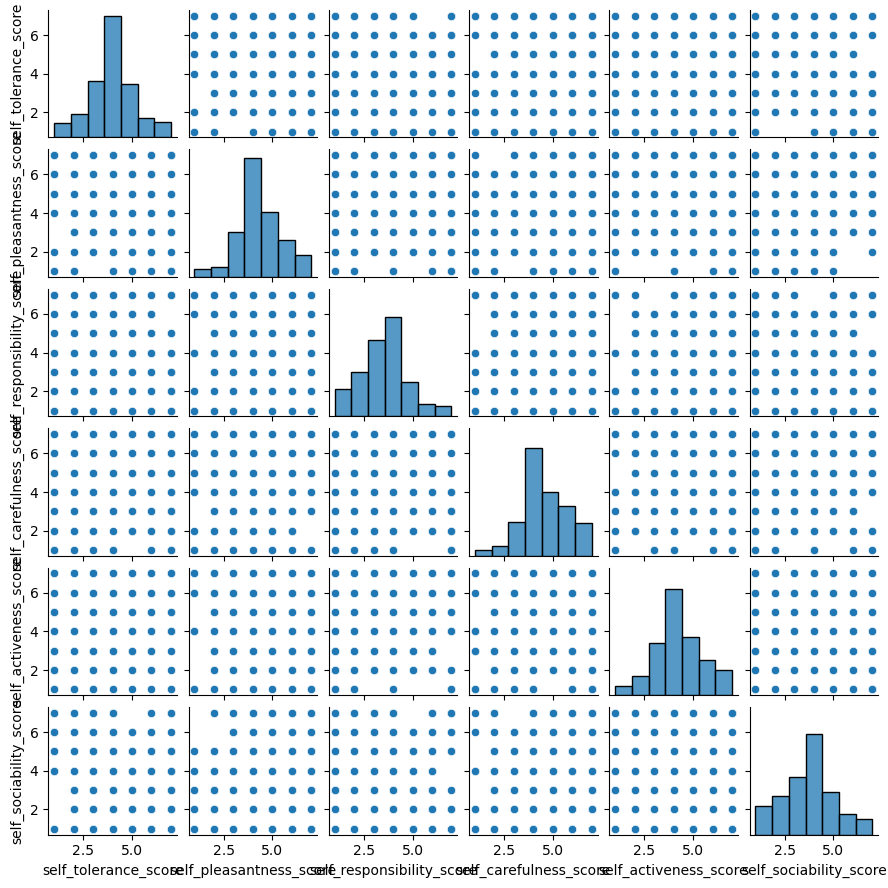

In [15]:
sns.pairplot(df[scorevar_name_self], height=1.5, diag_kind='hist', diag_kws={'bins':7})
plt.show()

<Axes: >

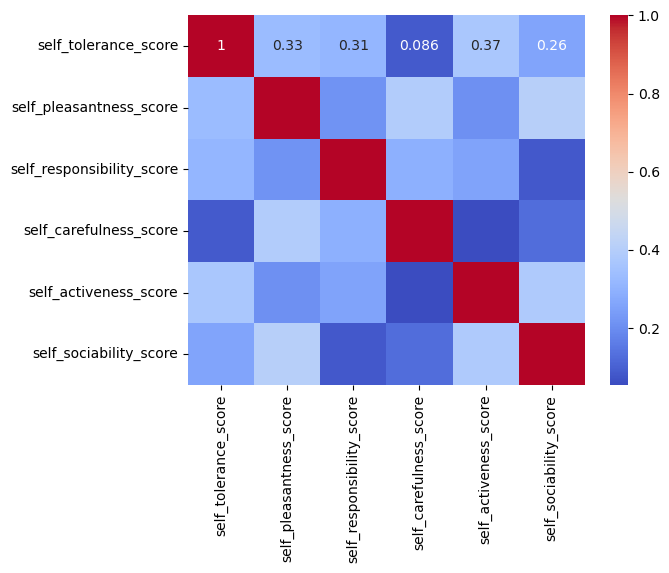

In [16]:
corr_self = df[scorevar_name_self].corr()
sns.heatmap(corr_self.abs(), annot=True, cmap='coolwarm')

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

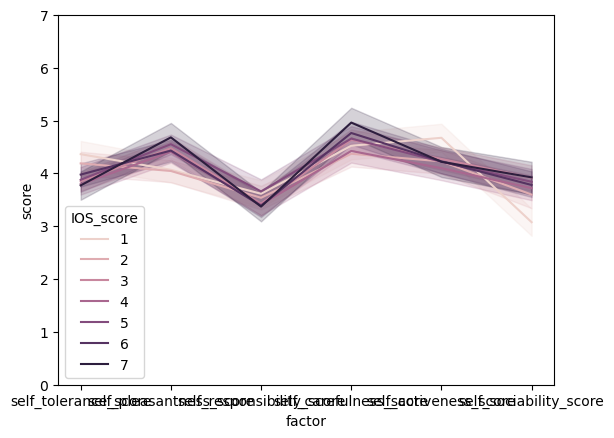

In [17]:
df_melt = pd.melt(frame=df, id_vars='IOS_score', value_vars=scorevar_name_self, value_name='score', var_name='factor')
ax = sns.lineplot(x='factor', y='score', data=df_melt, hue='IOS_score')
ax.set_ylim(0, 7)
plt.show()

### Trait adjcetive scores (target)

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

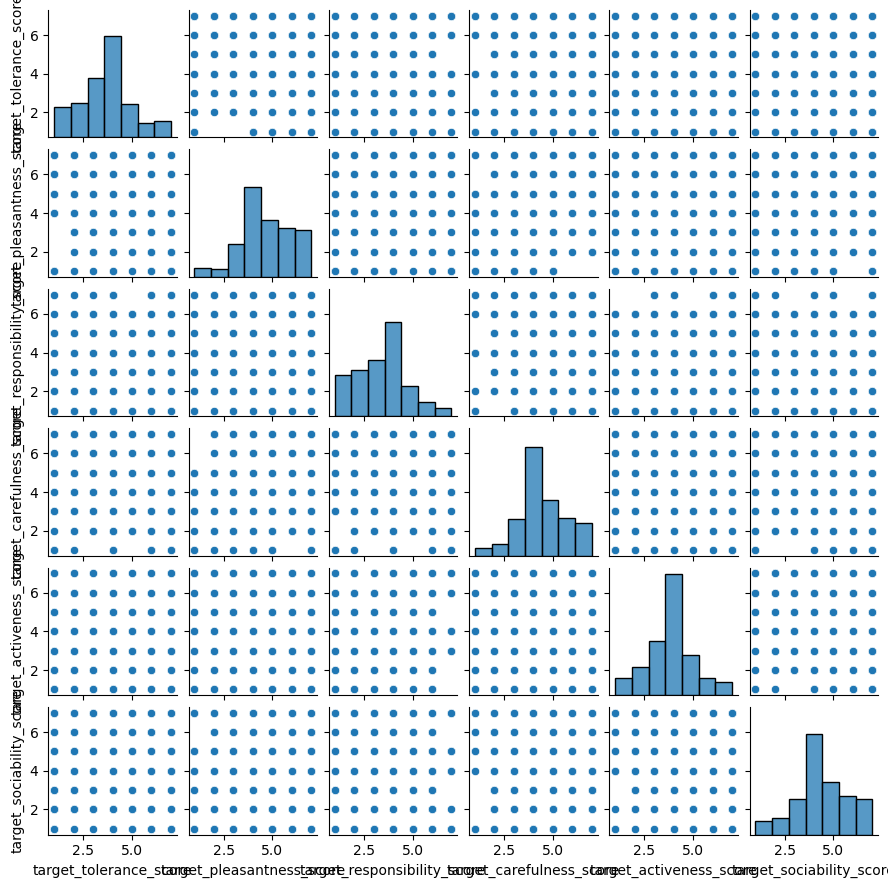

In [18]:
sns.pairplot(df[scorevar_name_target], height=1.5, diag_kind='hist', diag_kws={'bins':7})
plt.show()

<Axes: >

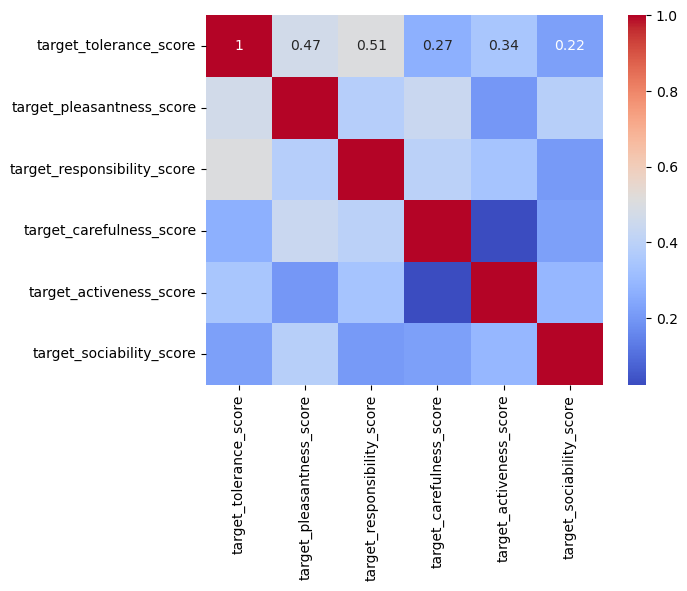

In [19]:
corr_target = df[scorevar_name_target].corr() # correlation matrix
sns.heatmap(corr_target.abs(), annot=True, cmap='coolwarm')

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

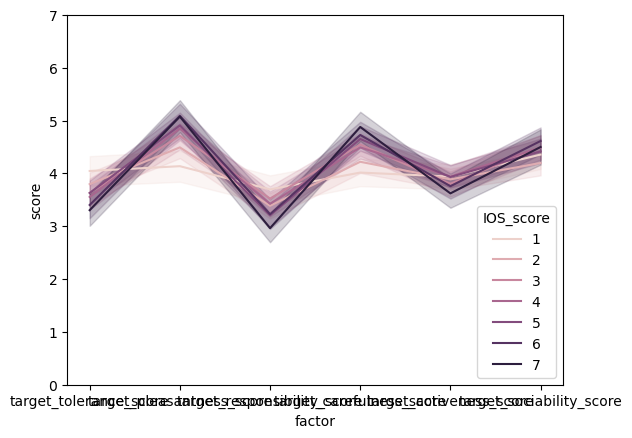

In [20]:
df_melt = pd.melt(frame=df, id_vars='IOS_score', value_vars=scorevar_name_target, value_name='score', var_name='factor')
ax = sns.lineplot(x='factor', y='score', data=df_melt, hue='IOS_score')
ax.set_ylim(0, 7)
plt.show()

### Trait adjective scores (self + target)

In [21]:
df[scorevar_name].head()

,self_tolerance_score,self_pleasantness_score,self_responsibility_score,self_carefulness_score,self_activeness_score,self_sociability_score,target_tolerance_score,target_pleasantness_score,target_responsibility_score,target_carefulness_score,target_activeness_score,target_sociability_score
MID,,,,,,,,,,,,
1,4,4,4,4,4,3,4,4,4,4,4,3
2,3,4,3,4,5,2,6,5,1,4,7,6
3,3,3,3,3,3,3,3,4,3,3,3,3
4,1,7,1,7,3,4,1,6,1,7,2,7
5,3,4,5,3,4,2,5,3,6,2,5,3


/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

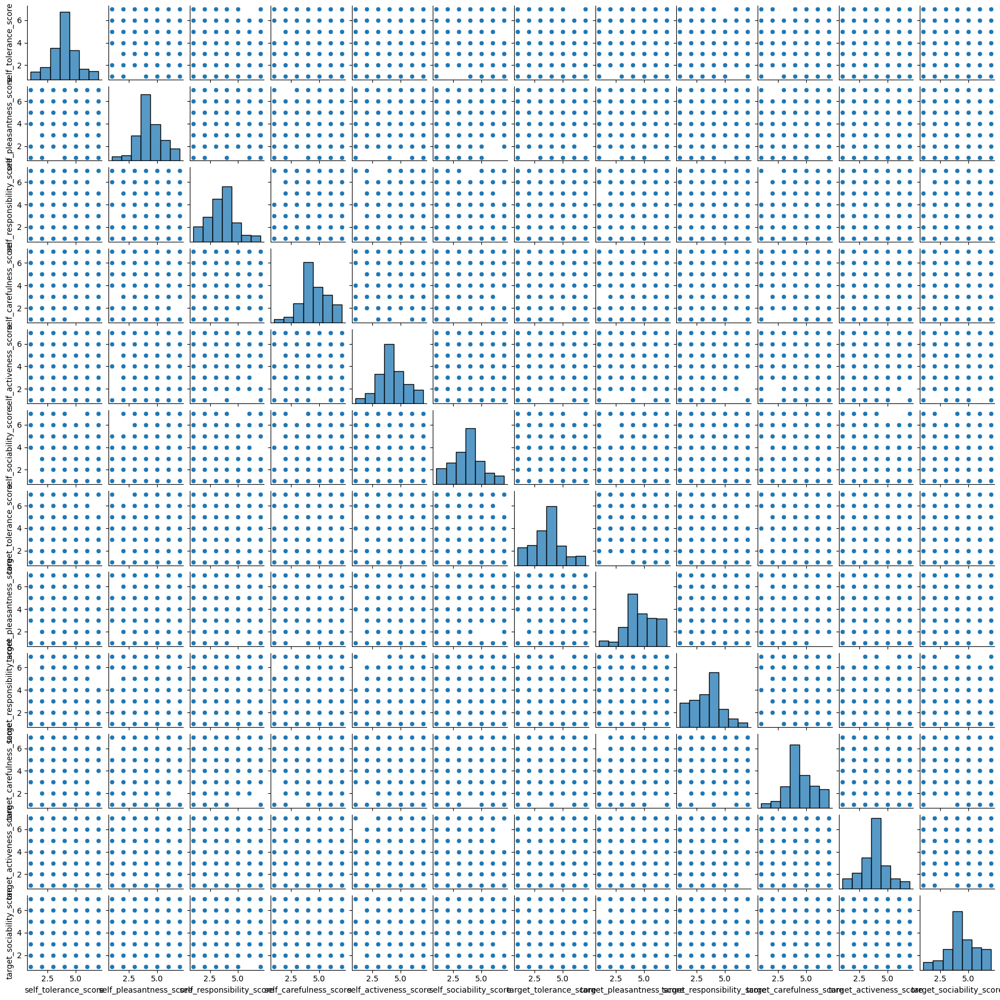

In [22]:
sns.pairplot(df[scorevar_name], height=1.5, diag_kind='hist', diag_kws={'bins':7})
plt.show()

In [23]:
corr_trait = df[scorevar_name].corr() # correlation matrix
corr_trait.head()

,self_tolerance_score,self_pleasantness_score,self_responsibility_score,self_carefulness_score,self_activeness_score,self_sociability_score,target_tolerance_score,target_pleasantness_score,target_responsibility_score,target_carefulness_score,target_activeness_score,target_sociability_score
self_tolerance_score,1.000000,-0.330124,0.311135,-0.086474,0.368510,-0.260243,0.202479,-0.117887,0.204571,-0.068266,0.166342,-0.022477
self_pleasantness_score,-0.330124,1.000000,-0.213780,0.391164,-0.209007,0.407906,-0.107778,0.353684,-0.153008,0.264220,0.004491,0.146960
self_responsibility_score,0.311135,-0.213780,1.000000,-0.292981,0.256788,-0.080872,0.222083,-0.124345,0.322826,-0.085005,0.205282,-0.091657
self_carefulness_score,-0.086474,0.391164,-0.292981,1.000000,0.054062,0.126566,-0.078168,0.303926,-0.106738,0.177161,-0.091990,0.199913
self_activeness_score,0.368510,-0.209007,0.256788,0.054062,1.000000,-0.383387,0.188641,-0.048359,0.159352,-0.050740,0.174660,-0.012084


<Axes: >

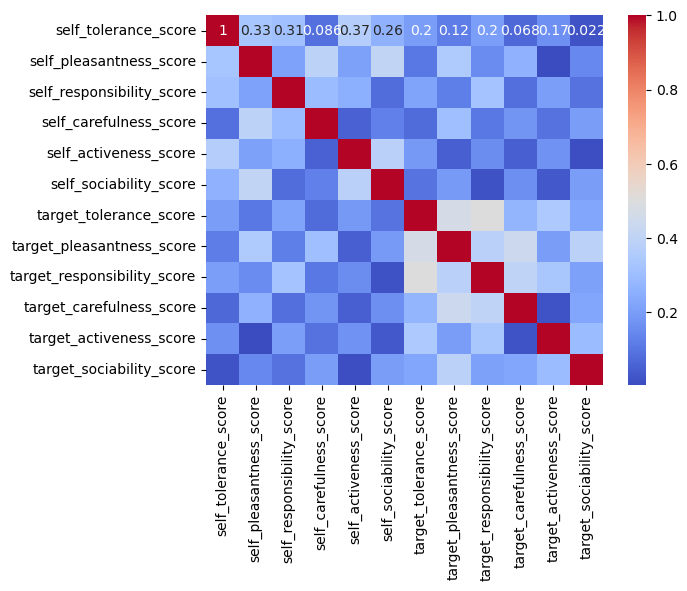

In [24]:
sns.heatmap(corr_trait.abs(), annot=True, cmap='coolwarm')

# Data Exclusion
We expected that the most frequent responses are meaningless, e.g., "回答なし" or "わからない". So, we tried to excluded those responses based on their apperance frequency.
- step1: Examines the most frequent responses
- step2: Replaces the frequent responses with a whitespace
- step3: Excludes participants whose responses are all whitespaces

## Step 1: Exclude participant who rated IOS socre with 4

In [25]:
# exclude rows wit IOS score of 4
df = df[df['IOS_score'] != 4]
# show demographic information
print(df.groupby("self_sex")["self_age"].describe())
# show the distribution of IOS score
print(df.groupby('IOS_score').size())

          count       mean        std   min   25%   50%   75%   max
self_sex                                                           
1         469.0  49.206823   8.077739  22.0  44.0  52.0  55.0  59.0
2         319.0  44.608150   9.598549  21.0  37.0  46.0  53.0  59.0
4           4.0  43.000000  14.764823  23.0  36.5  46.5  53.0  56.0
IOS_score
1    132
2    132
3    132
5    132
6    132
7    132
dtype: int64


## Step 2-1: Examines the most frequent responses

In [26]:
s_concat = pd.Series(dtype=object)
for col in textvar_name:
	s_concat = pd.concat([s_concat, df.loc[:, col]], ignore_index=True)

In [27]:
s_concat.info()

<class 'pandas.core.series.Series'>
RangeIndex: 9504 entries, 0 to 9503
Series name: None
Non-Null Count  Dtype 
--------------  ----- 
9504 non-null   object
dtypes: object(1)
memory usage: 74.4+ KB


In [28]:
s_concat

0                           回答なし
1                           回答なし
2                    見てても文句言われない
3                           回答なし
4                      直ぐに許してしまう
                  ...           
9499              周りに合わせるのがうまいから
9500                        営業マン
9501                        回答無し
9502                      とても社交的
9503    人とのコミュニケーションを取りたがらない人間嫌い
Length: 9504, dtype: object

In [29]:
s_concat.value_counts().head(30)

回答なし          4002
なし            1346
ない             398
特になし           214
回答無し           127
特にない            81
普通              46
わからない           43
なんとなく           43
特に              25
特に無し            24
無し              21
回答ない            18
とくになし           18
とくにありません        17
nai             15
特にありません         13
良い感じ            12
no              12
特にございません        12
回答ﾅｼ            12
特にない、わからない      11
特にありません。        11
特にはありません        11
どちらともいえない       10
ありません           10
回答なし。           10
何となく             9
普通だから            9
分からない            9
Name: count, dtype: int64

In [30]:
rep_list = list(s_concat.value_counts()[0:20].index) # Top 20 frequent responses
print(rep_list)

['回答なし', 'なし', 'ない', '特になし', '回答無し', '特にない', '普通', 'わからない', 'なんとなく', '特に', '特に無し', '無し', '回答ない', 'とくになし', 'とくにありません', 'nai', '特にありません', '良い感じ', 'no', '特にございません']


## Step 2-2 : Replaces the responses and excludes the records

In [31]:
len(df)

792

In [32]:
# replace the top 20 frequent responses with empty strings and remove the participants who provided the same response for all items
df2 = df.replace(rep_list, '').drop_duplicates(subset=textvar_name, keep=False)

In [33]:
len(df2)

403

## Check the remaining records

In [34]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 403 entries, 2 to 924
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   start                        403 non-null    object 
 1   end                          403 non-null    object 
 2   rt                           403 non-null    float64
 3   self_sex                     403 non-null    int64  
 4   self_age                     403 non-null    int64  
 5   residence                    403 non-null    int64  
 6   participation                403 non-null    int64  
 7   IOS_score                    403 non-null    int64  
 8   target_likedislike           403 non-null    int64  
 9   target_sex                   403 non-null    int64  
 10  target_age                   403 non-null    int64  
 11  relationship                 403 non-null    object 
 12  self_tolerance_score         403 non-null    int64  
 13  self_tolerance_text      

In [35]:
df2.loc[:, textvar_name].head(10)

,self_tolerance_text,self_pleasantness_text,self_responsibility_text,self_carefulness_text,self_activeness_text,self_sociability_text,target_tolerance_text,target_pleasantness_text,target_responsibility_text,target_carefulness_text,target_activeness_text,target_sociability_text
MID,,,,,,,,,,,,
2,,,,,,回答梨,,,,,,
5,見てても文句言われない,,,,,,,愛想が悪い,見かけただけだから,見てても文句言われない,見るのは許してくれる,あんまり反応がない
7,直ぐに許してしまう,人に道を聞かれる,休暇中でも仕事のことが気になる,たまに物を落とす,慎重に物事を進める,飲み会が嫌い,怒っても直ぐに許してくれる,優しい,真面目で勤勉,確りしている,大人しい,インドアが好き
8,,,,かし,,,,,,,ふつう,
11,普通の人です,,いったことは守ります,,,社交的ではないが他者を排除しない,,,,,,
13,,,,,,,,,まあまあ,いろいろ,,
27,自分のことばかりだから,他人に対して不愛想だから,逃げることばかり考えているから,常に二の足を踏むから,何も動こうとしないから,人と触れ合うと疲れるため,自分とも話をしてくれるから,自分に合わせてくれるから,そこまでの付き合いがないから,詳しく知らないから,話していると元気をもらえるから,話していて疲れないから
28,,知らない,,,,知らない,,,知らない,,,知らない
31,,,,わりと,,,,たぶん,,多分,わりと,


In [36]:
s_concat2 = pd.Series(dtype=object)
for col in textvar_name:
	s_concat2 = pd.concat([s_concat2, df2.loc[:, col]], ignore_index=True)

In [37]:
s_concat2.value_counts().head(30)

                        1819
回答ﾅｼ                      12
特にはありません                  11
特にありません。                  11
特にない、わからない                11
回答なし。                     10
ありません                     10
どちらともいえない                 10
何となく                       9
分からない                      9
普通だと思う                     9
普通だから                      9
まあまあ                       8
回答無                        8
話が広がる                      7
よくわからない                    7
優しい                        7
どちらとも言えない                  7
かいとうなし                     7
特にないです。                    7
誰とでも仲良くなれる                 7
とくになしとくになしとくになしとくのなし       6
場面による                      6
解答なし                       6
人見知り                       6
いつもながら                     6
とくにない                      6
回答                         6
そう思う                       6
何とも言えない                    5
Name: count, dtype: int64

In [38]:
df2.isnull().sum().sum()

0

# Psychometrics after data exclusion

## Completion ratio

In [39]:
print('Num. of Original Samples: ' + str(len(df)))
print('Num. of Excluded Samples: ' + str(len(df) - len(df2)))
print('Num. of Remaining Samples: ' + str(len(df2)))
print('Completion Ratio: ' + str(len(df2) / len(df)))

Num. of Original Samples: 792
Num. of Excluded Samples: 389
Num. of Remaining Samples: 403
Completion Ratio: 0.5088383838383839


## Demographic summary and the distribution of IOS scores

In [40]:
# show demographic information 
print(df2.groupby("self_sex")["self_age"].describe())

          count       mean        std   min   25%   50%   75%   max
self_sex                                                           
1         215.0  49.246512   7.920733  24.0  44.0  52.0  55.0  59.0
2         185.0  45.513514   9.348976  21.0  39.0  47.0  53.0  59.0
4           3.0  40.000000  16.522712  23.0  32.0  41.0  48.5  56.0


## Time to complete the questionnare

In [41]:
df2.groupby('IOS_score')['rt'].describe()

,count,mean,std,min,25%,50%,75%,max
IOS_score,,,,,,,,
1,65.0,423.015385,359.228753,103.0,232.00,315.0,475.00,2659.0
2,75.0,502.680000,772.684547,85.0,186.50,298.0,485.50,5847.0
3,60.0,869.433333,2848.256281,76.0,210.00,309.5,689.00,22147.0
5,65.0,5710.261538,29599.020254,91.0,198.00,297.0,576.00,227706.0
6,72.0,1522.694444,7178.954219,101.0,197.75,273.5,456.25,55495.0
7,66.0,2109.015152,11180.909896,89.0,171.00,293.0,609.00,89172.0


/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


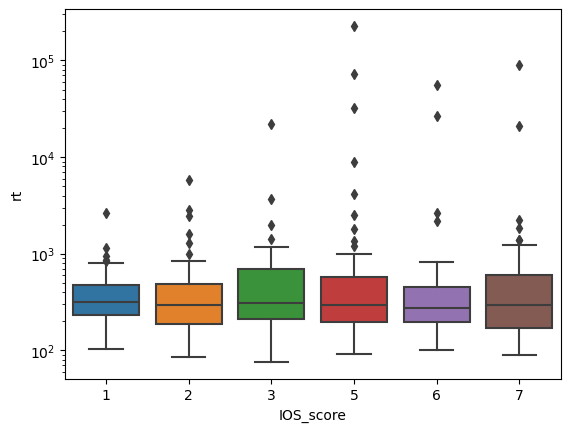

In [42]:
# boxplot for rt by IOS score
ax = sns.boxplot(x='IOS_score', y='rt', data=df2)
ax.set_yscale('log')
plt.show()

## IOS

In [43]:
# the distribution of IOS score
print(df2.groupby('IOS_score').size())
# the completion ration for each score
print(df2.groupby('IOS_score').size() / df.groupby('IOS_score').size())

IOS_score
1    65
2    75
3    60
5    65
6    72
7    66
dtype: int64
IOS_score
1    0.492424
2    0.568182
3    0.454545
5    0.492424
6    0.545455
7    0.500000
dtype: float64


## FA on Trait adjective scores (self)

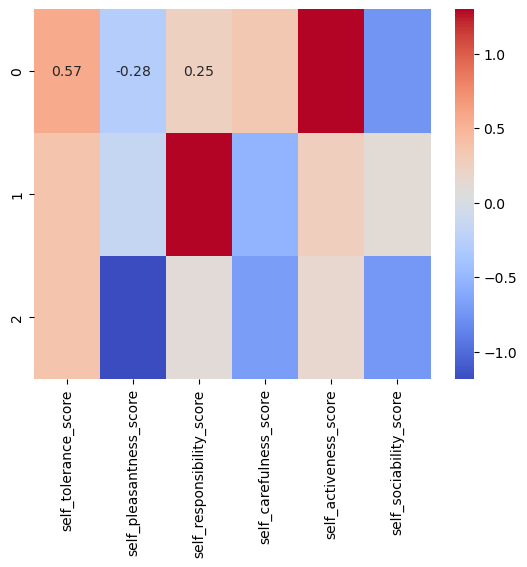

In [44]:
fa = FactorAnalysis(n_components=3, rotation='varimax')
df2_fa_self = fa.fit_transform(df2[scorevar_name_self])

df2_fa_self_loadings = pd.DataFrame(fa.components_, columns=scorevar_name_self)
sns.heatmap(df2_fa_self_loadings, annot=True, cmap='coolwarm')
plt.show()

## FA on Trait adjective scores (target)

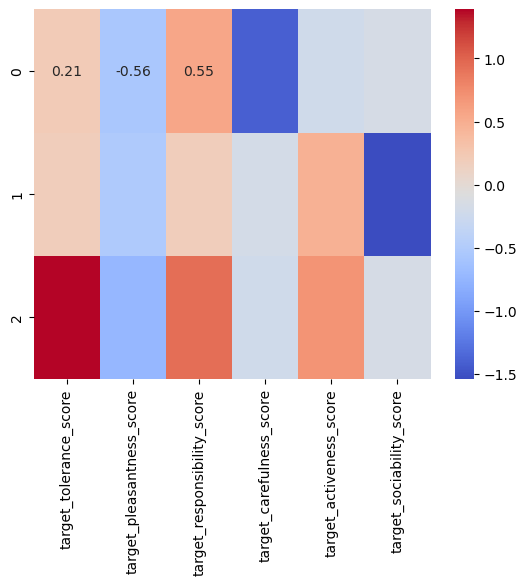

In [45]:
fa = FactorAnalysis(n_components=3, rotation='varimax')
df2_fa_target = fa.fit_transform(df2[scorevar_name_target])

df2_fa_target_loadings = pd.DataFrame(fa.components_, columns=scorevar_name_target)
sns.heatmap(df2_fa_target_loadings, annot=True, cmap='coolwarm')
plt.show()

## Trait adjective scores (self + target)

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

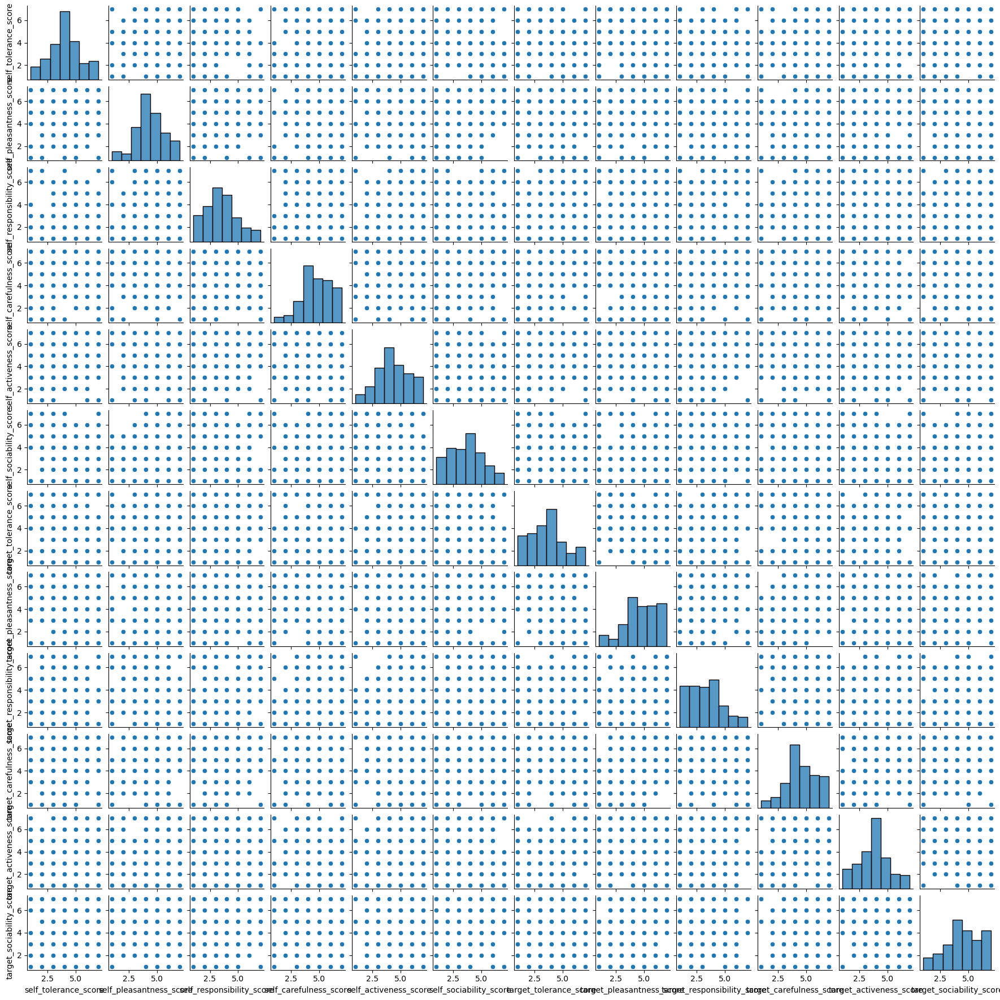

In [46]:
sns.pairplot(df2[scorevar_name], height=1.5, diag_kind="hist", diag_kws={'bins':7})
plt.show()

In [47]:
corr_both = df2[scorevar_name].corr()
corr_both.head(6)

,self_tolerance_score,self_pleasantness_score,self_responsibility_score,self_carefulness_score,self_activeness_score,self_sociability_score,target_tolerance_score,target_pleasantness_score,target_responsibility_score,target_carefulness_score,target_activeness_score,target_sociability_score
self_tolerance_score,1.000000,-0.302007,0.264776,-0.081740,0.355048,-0.222356,0.175001,-0.076889,0.204959,-0.003616,0.131866,0.049080
self_pleasantness_score,-0.302007,1.000000,-0.158925,0.368463,-0.248674,0.432672,-0.051262,0.342579,-0.113117,0.220417,0.041848,0.080434
self_responsibility_score,0.264776,-0.158925,1.000000,-0.283709,0.264733,-0.041269,0.187080,-0.039263,0.331966,-0.014480,0.144076,-0.050564
self_carefulness_score,-0.081740,0.368463,-0.283709,1.000000,0.071442,0.089287,0.002872,0.274044,-0.033458,0.146284,-0.080956,0.152142
self_activeness_score,0.355048,-0.248674,0.264733,0.071442,1.000000,-0.397786,0.206262,-0.034697,0.154100,-0.033195,0.126092,-0.003585
self_sociability_score,-0.222356,0.432672,-0.041269,0.089287,-0.397786,1.000000,-0.054248,0.184228,0.038025,0.140496,0.024630,0.159237


<Axes: >

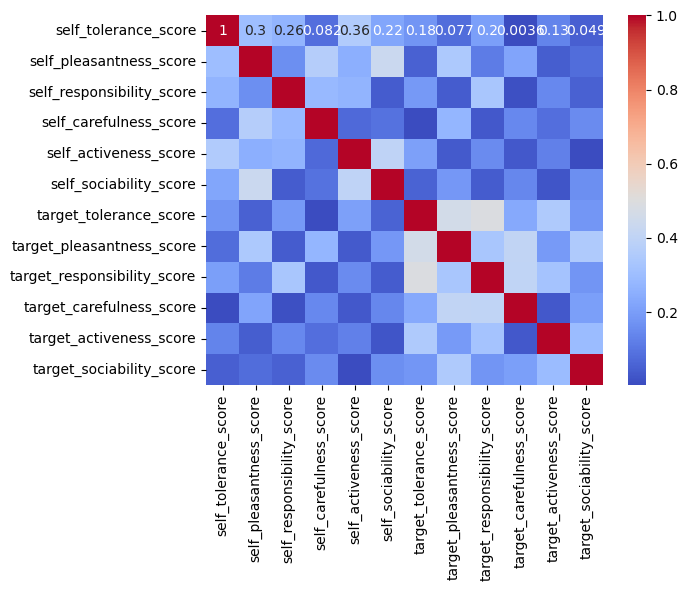

In [48]:
sns.heatmap(corr_both.abs(), annot=True, cmap='coolwarm')

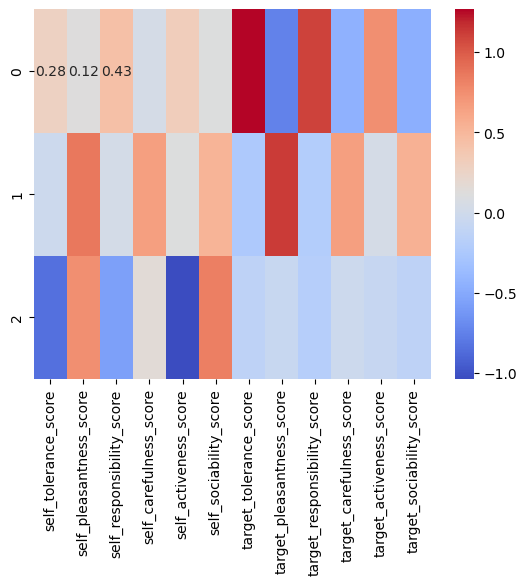

In [49]:
fa = FactorAnalysis(n_components=3, rotation='varimax')
df2_fa_both = fa.fit_transform(df2[scorevar_name])

df2_fa_both_loadings = pd.DataFrame(fa.components_, columns=scorevar_name)
sns.heatmap(df2_fa_both_loadings, annot=True, cmap='coolwarm')
plt.show()

## Data Profiling: IOS * Trait adjective scores

In [50]:
ProfileReport(df2[["IOS_score"] + scorevar_name], title='Profile Report of the Data', explorative=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Output
Save:
- Text data as txt
- Data Frame as xlsx

## Text Data

In [51]:
textvar_name_self

['self_tolerance_text',
 'self_pleasantness_text',
 'self_responsibility_text',
 'self_carefulness_text',
 'self_activeness_text',
 'self_sociability_text']

In [52]:
textvar_name_target

['target_tolerance_text',
 'target_pleasantness_text',
 'target_responsibility_text',
 'target_carefulness_text',
 'target_activeness_text',
 'target_sociability_text']

In [53]:
textvar_name

['self_tolerance_text',
 'self_pleasantness_text',
 'self_responsibility_text',
 'self_carefulness_text',
 'self_activeness_text',
 'self_sociability_text',
 'target_tolerance_text',
 'target_pleasantness_text',
 'target_responsibility_text',
 'target_carefulness_text',
 'target_activeness_text',
 'target_sociability_text']

In [54]:
df2.loc[:, textvar_name].head()

,self_tolerance_text,self_pleasantness_text,self_responsibility_text,self_carefulness_text,self_activeness_text,self_sociability_text,target_tolerance_text,target_pleasantness_text,target_responsibility_text,target_carefulness_text,target_activeness_text,target_sociability_text
MID,,,,,,,,,,,,
2,,,,,,回答梨,,,,,,
5,見てても文句言われない,,,,,,,愛想が悪い,見かけただけだから,見てても文句言われない,見るのは許してくれる,あんまり反応がない
7,直ぐに許してしまう,人に道を聞かれる,休暇中でも仕事のことが気になる,たまに物を落とす,慎重に物事を進める,飲み会が嫌い,怒っても直ぐに許してくれる,優しい,真面目で勤勉,確りしている,大人しい,インドアが好き
8,,,,かし,,,,,,,ふつう,
11,普通の人です,,いったことは守ります,,,社交的ではないが他者を排除しない,,,,,,


In [55]:
filename = './Results/output01_all.txt'
with open(filename, 'w') as f:
	df2_string = df2.loc[:, textvar_name].to_string(header=True, index=True)
	f.write(df2_string)

In [56]:
filename = './Results/output01_self.txt'
with open(filename, 'w') as f:
	df2_string = df2.loc[:, textvar_name_self].to_string(header=True, index=True)
	f.write(df2_string)

In [57]:
filename = './Results/output01_target.txt'
with open(filename, 'w') as f:
	df2_string = df2.loc[:, textvar_name_target].to_string(header=True, index=True)
	f.write(df2_string)

In [58]:
df2.drop(textvar_name, axis='columns', inplace=True)
df2.head()

,start,end,rt,self_sex,self_age,residence,participation,IOS_score,target_likedislike,target_sex,...,self_activeness_score,self_sociability_score,target_tolerance_score,target_pleasantness_score,target_responsibility_score,target_carefulness_score,target_activeness_score,target_sociability_score,completion,stratumID
MID,,,,,,,,,,,,,,,,,,,,,
2,2024/02/16-12:21:18,2024/02/16-12:24:31,193.0,1,45,28,1,5,3,2,...,5,2,6,5,1,4,7,6,COMP,5
5,2024/02/16-12:23:21,2024/02/16-12:25:38,137.0,1,36,28,1,2,4,2,...,4,2,5,3,6,2,5,3,COMP,9
7,2024/02/16-12:20:52,2024/02/16-12:25:45,293.0,1,54,12,1,5,1,2,...,5,3,1,7,1,6,6,2,COMP,5
8,2024/02/16-12:24:28,2024/02/16-12:26:11,103.0,1,36,14,1,1,1,2,...,3,3,1,7,1,5,4,7,COMP,1
11,2024/02/16-12:23:46,2024/02/16-12:26:26,160.0,1,56,13,1,2,1,2,...,4,4,4,4,4,4,4,4,COMP,2


In [59]:
df2.columns

Index(['start', 'end', 'rt', 'self_sex', 'self_age', 'residence',
       'participation', 'IOS_score', 'target_likedislike', 'target_sex',
       'target_age', 'relationship', 'self_tolerance_score',
       'self_pleasantness_score', 'self_responsibility_score',
       'self_carefulness_score', 'self_activeness_score',
       'self_sociability_score', 'target_tolerance_score',
       'target_pleasantness_score', 'target_responsibility_score',
       'target_carefulness_score', 'target_activeness_score',
       'target_sociability_score', 'completion', 'stratumID'],
      dtype='object')

In [60]:
filename = "./Results/output01_all.csv"
df2.to_csv(filename, index=True)